<a href="https://colab.research.google.com/github/MohammadAminDHM/Chest-Cancer-Detection-With-Chest-CT-Scan/blob/main/Main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center> <font face=timenewroman color=red size=10> Cancer diagnosis with Deep Learning</center>


#<center> <font face=timenewroman color=yellow> Mount drive and Management files </center>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [4]:
#@title Input The File paths
#Dataset

Dataset = './Workshop/Session_1/Dataset/Data'#@param

#Model
model_path = './Workshop/Session_1/Models/'#@param

#Single frame test
Desire_Image          = 'Desire image path'#@param

#<center> <font face=timenewroman color=yellow>  Import modules </center>

##<center> <font face=timenewroman color=gree>Install timm (Pretrained model module)</center>

In [6]:
%%capture
!pip install timm

##<center> <font face=timenewroman color=gree>Import modules</center>

 <font face=timenewroman color=white size=5>Comment with ChatGPT, How?!


<font face=timenewroman color=white size=5>

1.   With ChatGPT site
2.   ChatGPT Extension



In [7]:
import os                          # کتابخانه برای کار با سیستم عامل
from PIL import Image              # کتابخانه برای کار با تصاویر
import timm                        # مدل‌های پیش‌آموزش‌شده شبکه عصبی
from torchvision import datasets   # کتابخانه برای کار با داده‌های تصویری
import torchvision                # کتابخانه برای کار با داده‌های تصویری
import torch                       # کتابخانه پایتورچ برای پیاده‌سازی شبکه عصبی
from torchvision.transforms import transforms  # تبدیل تصاویر
import torchvision.models as models          # مدل‌های پیش‌آموزش‌شده شبکه عصبی
import numpy as np                 # کتابخانه نامپای برای کار با آرایه‌های عددی
from PIL import ImageFile          # تغییر تنظیمات برای پیشگیری از خطاها
from sklearn.model_selection import train_test_split   # کتابخانه برای تقسیم داده‌های آموزش و تست
import matplotlib.pyplot as plt    # کتابخانه برای رسم نمودارها
import json                        # کتابخانه برای کار با فایل‌های جی‌سان
import pandas as pd                # کتابخانه برای کار با داده‌های جدولی
import warnings                    # نادیده‌گرفتن و هشدار دادن خطاها
from sklearn.metrics import confusion_matrix as cm  # محاسبه ماتریس درهم‌ریختگی
import cv2                         # کتابخانه برای پردازش تصاویر
from IPython.display import clear_output  # پاک کردن خروجی سلول در جوپیتر نوت‌بوک
import time
import glob
import shutil

warnings.filterwarnings("ignore")   # نادیده‌گرفتن و هشدار دادن خطاها را غیرفعال می‌کن
ImageFile.LOAD_TRUNCATED_IMAGES = True

#<center> <font face=timenewroman color=yellow>Prepare dataset</center>

In [8]:
#@title <center> <font face=timenewroman color=gree>Input parameters</center>
batch_size = 32 #@param
num_workers = 0 #@param
shuffle = True #@param

#Peprocessing
transform = transforms.Compose([
    transforms.Resize(size=(224, 224)), #Resize
    transforms.ToTensor(), #Make suitable for network
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])])
     #Help to best training 


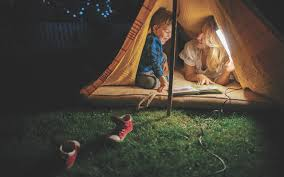

## <center> <font face=timenewroman color=gree>Dataset</center>

In [9]:
train_set = Dataset + '/train'
valid_set = Dataset + '/valid'

train_data = datasets.ImageFolder(train_set, transform=transform)
valid_data = datasets.ImageFolder(valid_set, transform=transform)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, num_workers=num_workers, shuffle=shuffle)
valid_loader = torch.utils.data.DataLoader(valid_data, batch_size=batch_size, num_workers=num_workers, shuffle=shuffle)

loaders = {
    'train': train_loader,
    'valid': valid_loader
} 

#<center> <font face=timenewroman color=yellow>Utils</center>

## <center> <font face=timenewroman color=gree>Criterion</center>

In [10]:
def cma(cm):
  """
  Confusion Matrix Analyse
  """
  recall    = []
  precision = []
  f1        = []
  for i in range(cm.shape[0]):
    recall.append(cm[i][i]/cm.sum(axis=0)[i])
    precision.append(cm[i][i]/cm.sum(axis=1)[i])
    f1.append(2 * (((cm[i][i]/cm.sum(axis=0)[i]) * (cm[i][i]/cm.sum(axis=1)[i]))/((cm[i][i]/cm.sum(axis=0)[i]) + (cm[i][i]/cm.sum(axis=1)[i]))))
  
  recall    = [x for x in recall if str(x) != 'nan']
  precision = [x for x in precision if str(x) != 'nan']
  f1        = [x for x in f1 if str(x) != 'nan']

  return [sum(recall)/len(recall), sum(precision)/len(precision), sum(f1)/len(f1)]

## <center> <font face=timenewroman color=gree>Train</center>

In [11]:
def train(n_epochs, loader, model, optimizer, criterion, use_cuda, save_path, model_name):

    # labels = ['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib',
    #           'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa',
    #           'normal',
    #           'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa'] 

    train_accuracy_list = []
    train_loss_list = []

    train_recall_list = []
    train_precision_list = []
    train_f1_list = []

    valid_accuracy_list = []
    valid_loss_list = []

    valid_recall_list = []
    valid_precision_list = []
    valid_f1_list = []

    valid_acc_max = 0.0
    valid_r_max = 0.0
    valid_p_max = 0.0
    valid_f1_max = 0.0    

    train_Confusion_matrix = np.zeros((4, 4)) 
    valid_Confusion_matrix = np.zeros((4, 4))        

    for epoch in range(1, (n_epochs+1)):
        
        train_loss = 0.0
        valid_loss = 0.0
        train_acc = 0.0
        valid_acc = 0.0
        
        model.train()
        start = time.time()
        for batch_idx, (data, target) in enumerate(loader['train']):
            target_1 = target
            if use_cuda:
                data, target_2 = data.cuda(), target.cuda()            

            optimizer.zero_grad()
            output = model(data)
            _, preds = torch.max(output, 1)
            loss = criterion(output, target_2)
            loss.backward()
            optimizer.step()
            train_Confusion_matrix += cm(preds.cpu().detach().numpy(), target_1.numpy(), labels=[i for i in range(4)])                      
            train_acc = train_acc + torch.sum(preds == target_2.data)
            train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
                
                
        model.eval()
        for batch_idx, (data, target) in enumerate(loader['valid']):
            target_1 = target
            if use_cuda:
                data, target_2 = data.cuda(), target.cuda()                
            output = model(data)
            
            _, preds = torch.max(output, 1)
            loss = criterion(output, target_2)            
            
            valid_Confusion_matrix += cm(preds.cpu().detach().numpy(), target_1, labels=[i for i in range(4)])
            valid_acc = valid_acc + torch.sum(preds == target_2.data)
            valid_loss = valid_loss + ((1 / (batch_idx + 1)) * (loss.data - valid_loss))

            
        train_loss = train_loss/len(loader['train'].dataset)
        valid_loss = valid_loss/len(loader['valid'].dataset)
        train_acc = train_acc/len(loader['train'].dataset)
        valid_acc = valid_acc/len(loader['valid'].dataset)


        train_result = cma(train_Confusion_matrix)
        valid_result = cma(valid_Confusion_matrix)

        train_recall_list.append(train_result[0])
        train_precision_list.append(train_result[1])
        train_f1_list.append(train_result[2])

        valid_recall_list.append(valid_result[0])
        valid_precision_list.append(valid_result[1])
        valid_f1_list.append(valid_result[2])

        train_loss_list.append(train_loss)
        valid_loss_list.append(valid_loss)

        train_accuracy_list.append(train_acc)
        valid_accuracy_list.append(valid_acc)


        Epoch_time = time.time() - start
        print('Epoch: {}\
              \n Epoch Time: {:6f}\
              \nTraining Acc: {:6f}\
              \nTraining Loss: {:6f}\
              \nTraining recall: {:6f}\
              \nTraining precision: {:6f}\
              \nTraining F1 Score: {:6f}\
              \n\n\
              \nValidation Acc: {:6f}\
              \nValidation Loss: {:.6f}\
              \nValidation recall: {:6f}\
              \nValidation precision: {:6f}\
              \nValidation F1 Score: {:6f}           '.format(
                                                        epoch,
                                                        Epoch_time,
                                                        train_acc,
                                                        train_loss,
                                                        train_result[0],
                                                        train_result[1],
                                                        train_result[2],
                                                        valid_acc,
                                                        valid_loss,
                                                        valid_result[0],
                                                        valid_result[1],
                                                        valid_result[2]
                                                        ))

        if valid_acc >= valid_acc_max:
            print('\n\nValidation accuracy increased ({:.6f} --> {:.6f}).  Saving model ...'.format(
            valid_acc_max,
            valid_acc))
            torch.save(model.state_dict(), save_path + 'model_' + model_name + '_acc_max.pt')
            valid_acc_max = valid_acc

        if valid_result[0] >= valid_r_max:
            print('\n\nValidation recall true increased ({:.6f} --> {:.6f}).  Saving model ...'.format(
            valid_r_max,
            valid_result[0]))
            torch.save(model.state_dict(), save_path + 'model_' + model_name + '_r_max.pt')
            valid_r_max = valid_result[0]  

        if valid_result[1] >= valid_p_max:
            print('\n\nValidation precision true increased ({:.6f} --> {:.6f}).  Saving model ...'.format(
            valid_p_max,
            valid_result[1]))
            torch.save(model.state_dict(), save_path + 'model_' + model_name + '_p_max.pt')
            valid_p_max = valid_result[1]
            
        if valid_result[2] >= valid_f1_max:
            print('\n\nValidation F1 true increased ({:.6f} --> {:.6f}).  Saving model ...'.format(
            valid_f1_max,
            valid_result[2]))
            torch.save(model.state_dict(), save_path + 'model_' + model_name + '_f1_max.pt')
            valid_f1_max = valid_result[2]


        print('\n\n ------------------------------------------------------- \n\n')  
    
    
    train_loss_list     = [i.cpu().tolist() for i in train_loss_list]
    valid_loss_list     = [i.cpu().tolist() for i in valid_loss_list]
    train_accuracy_list = [i.cpu().tolist() for i in train_accuracy_list]
    valid_accuracy_list = [i.cpu().tolist() for i in valid_accuracy_list]

    with open(save_path + 'model_' + model_name + '_train_accuracy_list.json', 'w') as f:
      json.dump(train_accuracy_list, f, indent=2)

    with open(save_path + 'model_' + model_name + '_train_loss_list.json', 'w') as f:
      json.dump(train_loss_list, f, indent=2)

    with open(save_path + 'model_' + model_name + '_train_recall_list.json', 'w') as f:
      json.dump(train_recall_list, f, indent=2)      

    with open(save_path + 'model_' + model_name + '_train_precision_list.json', 'w') as f:
      json.dump(train_precision_list, f, indent=2)
                  
    with open(save_path + 'model_' + model_name + '_train_f1_list.json', 'w') as f:
      json.dump(train_f1_list, f, indent=2)
            
    with open(save_path + 'model_' + model_name + '_valid_accuracy_list.json', 'w') as f:
      json.dump(valid_accuracy_list, f, indent=2)

    with open(save_path + 'model_' + model_name + '_valid_loss_list.json', 'w') as f:
      json.dump(valid_loss_list, f, indent=2)

    with open(save_path + 'model_' + model_name + '_valid_recall_list.json', 'w') as f:
      json.dump(valid_recall_list, f, indent=2)      

    with open(save_path + 'model_' + model_name + '_valid_precision_list.json', 'w') as f:
      json.dump(valid_precision_list, f, indent=2)
                  
    with open(save_path + 'model_' + model_name + '_valid_f1_list.json', 'w') as f:
      json.dump(valid_f1_list, f, indent=2)
        
    return model


## <center> <font face=timenewroman color=gree>Predict</center>

In [12]:
def predict(image, model, device, class_name):  
  
    prediction_transform = transforms.Compose([transforms.Resize(size=(224, 224)),
                                               transforms.ToTensor(), 
                                               transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
    try:
      image = prediction_transform(image)[:3,:,:].unsqueeze(0)
    except:
      image = image.convert('RGB')
      image = prediction_transform(image)[:3,:,:].unsqueeze(0)
    
    if device == 'cuda':
        if torch.cuda.is_available():
            image = image.cuda()
        else:
            print("You don't have cuda")

    with torch.no_grad():      
      model.eval()
      pred = model(image)

      
    idx = torch.argmax(pred)

    prob = pred[0][idx].item()*100
    
    return prob, class_name[idx]

## <center> <font face=timenewroman color=gree>Single frame app</center>

In [13]:
def app(path, model, device, class_name, display_prob, show):
    img = Image.open(path)
    if show:
      plt.imshow(img)
      plt.show()

    prob, result = predict(img, model, device, class_name)
    if display_prob:
      print('Probability of {} : {:.6f}'.format(result, prob))
                  
    return prob, result


#<center> <font face=timenewroman color=yellow>Train</center>

## <center> <font face=timenewroman color=gree>Prepare model</center>

<font face=timenewroman color=white size=5>Pretrain Models in Timm

In [12]:
timm.list_models()

['adv_inception_v3',
 'bat_resnext26ts',
 'beit_base_patch16_224',
 'beit_base_patch16_224_in22k',
 'beit_base_patch16_384',
 'beit_large_patch16_224',
 'beit_large_patch16_224_in22k',
 'beit_large_patch16_384',
 'beit_large_patch16_512',
 'beitv2_base_patch16_224',
 'beitv2_base_patch16_224_in22k',
 'beitv2_large_patch16_224',
 'beitv2_large_patch16_224_in22k',
 'botnet26t_256',
 'botnet50ts_256',
 'cait_m36_384',
 'cait_m48_448',
 'cait_s24_224',
 'cait_s24_384',
 'cait_s36_384',
 'cait_xs24_384',
 'cait_xxs24_224',
 'cait_xxs24_384',
 'cait_xxs36_224',
 'cait_xxs36_384',
 'coat_lite_mini',
 'coat_lite_small',
 'coat_lite_tiny',
 'coat_mini',
 'coat_tiny',
 'coatnet_0_224',
 'coatnet_0_rw_224',
 'coatnet_1_224',
 'coatnet_1_rw_224',
 'coatnet_2_224',
 'coatnet_2_rw_224',
 'coatnet_3_224',
 'coatnet_3_rw_224',
 'coatnet_4_224',
 'coatnet_5_224',
 'coatnet_bn_0_rw_224',
 'coatnet_nano_cc_224',
 'coatnet_nano_rw_224',
 'coatnet_pico_rw_224',
 'coatnet_rmlp_0_rw_224',
 'coatnet_rmlp_1_rw

<font face=timenewroman color=white size=5>We are using the ResNet50 model

In [15]:
model = timm.create_model('resnet50', pretrained=True)

use_cuda = torch.cuda.is_available()

if use_cuda:
    model = model.cuda()    

Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-rsb-weights/resnet50_a1_0-14fe96d1.pth" to /root/.cache/torch/hub/checkpoints/resnet50_a1_0-14fe96d1.pth


<font face=timenewroman color=white size=5>Models structure

In [14]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
      (act2): ReLU(inplace=True)
      (aa): Identity()
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     

In [16]:
for param in model.parameters():
    param.requires_grad = False

model.fc = torch.nn.Sequential(torch.nn.Linear(2048, 256),
                                      torch.nn.Dropout(0.2),
                                      torch.nn.ReLU(),
                                      torch.nn.Linear(256, 64),
                                      torch.nn.Dropout(0.2),
                                      torch.nn.ReLU(),
                                      torch.nn.Linear(64, 32),
                                      torch.nn.Dropout(0.2),
                                      torch.nn.ReLU(),                               
                                      torch.nn.Linear(32, 4),                                                                     
                                      torch.nn.Softmax()
                                      )

for param in model.fc.parameters():
    param.requires_grad = True

if use_cuda:
    model_transfer = model.cuda()    
else:
    model_transfer = model

## <center> <font face=timenewroman color=gree>Start Train</center>

In [40]:
#@title ###<font face=timenewroman color=white size=5> Parameters
n_epochs         = 200 #@param
lr               = 0.001 #@param
wd               = 0.0001 #@param
model_name       = 'ResNet50' #@param
save_model_path  = model_path #@param
use_cuda         = True #@param

###<font face=timenewroman color=white size=5>Train model

In [41]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model_transfer.fc.parameters(), lr=lr, weight_decay=wd)

In [42]:
model = train(n_epochs, loaders, model, optimizer, criterion, use_cuda, save_model_path, model_name)

Streaming output truncated to the last 5000 lines.


 ------------------------------------------------------- 


Epoch: 18              
 Epoch Time: 7.713713              
Training Acc: 0.747145              
Training Loss: 0.001596              
Training recall: 0.590110              
Training precision: 0.547123              
Training F1 Score: 0.546085              

              
Validation Acc: 0.569444              
Validation Loss: 0.015966              
Validation recall: 0.594404              
Validation precision: 0.628657              
Validation F1 Score: 0.692265           


Validation recall true increased (0.591645 --> 0.594404).  Saving model ...


Validation precision true increased (0.628586 --> 0.628657).  Saving model ...


Validation F1 true increased (0.690793 --> 0.692265).  Saving model ...


 ------------------------------------------------------- 


Epoch: 19              
 Epoch Time: 7.662971              
Training Acc: 0.753670              
Training Los

###<font face=timenewroman color=white size=5>Result

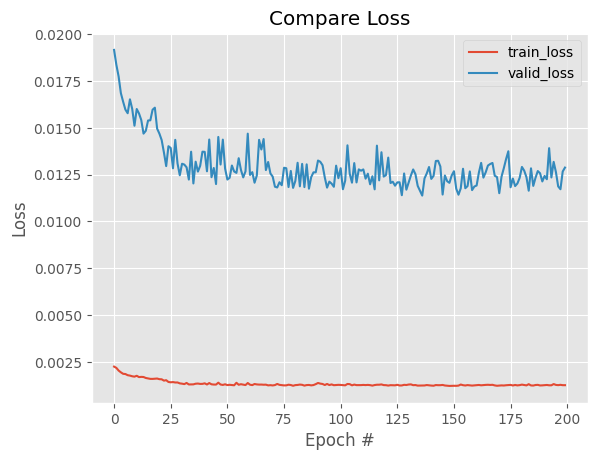

In [43]:
loss_t = open('./Workshop/Session_1/Models/model_ResNet50_train_loss_list.json')
loss_t = json.load(loss_t)

loss_v = open('./Workshop/Session_1/Models/model_ResNet50_valid_loss_list.json')
loss_v = json.load(loss_v)

plt.ion()
plt.style.use("ggplot")
plt.figure()
plt.plot(loss_t, label="train_loss")
plt.plot(loss_v, label="valid_loss")
plt.title("Compare Loss")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend(loc="upper right")

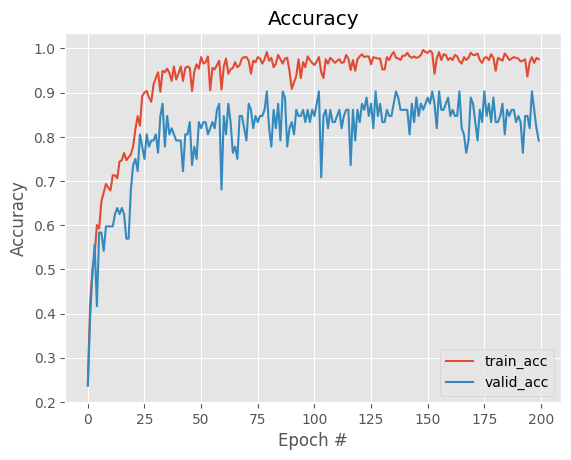

In [46]:
acc_t = open('./Workshop/Session_1/Models/model_ResNet50_train_accuracy_list.json')
acc_t = json.load(acc_t)

acc_v = open('./Workshop/Session_1/Models/model_ResNet50_valid_accuracy_list.json')
acc_v = json.load(acc_v)

plt.ion()
plt.style.use("ggplot")
plt.figure()

plt.plot(acc_t, label="train_acc")
plt.plot(acc_v, label="valid_acc")

plt.title("Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Accuracy")
plt.legend(loc="lower right")

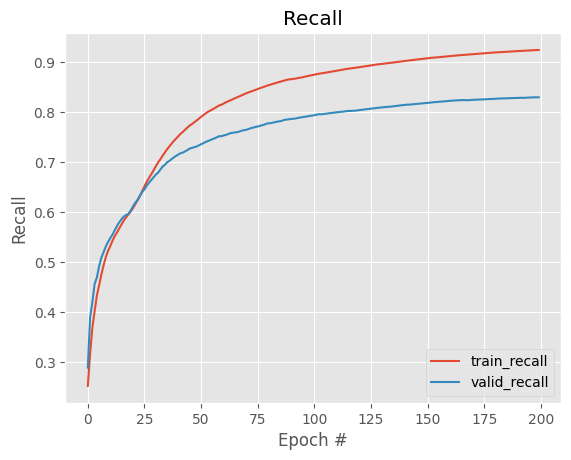

In [48]:
rec_t = open('./Workshop/Session_1/Models/model_ResNet50_train_recall_list.json')
rec_t = json.load(rec_t)

rec_v = open('./Workshop/Session_1/Models/model_ResNet50_valid_recall_list.json')
rec_v = json.load(rec_v)

plt.ion()
plt.style.use("ggplot")
plt.figure()
plt.plot(rec_t, label="train_recall")
plt.plot(rec_v, label="valid_recall")

plt.title("Recall")
plt.xlabel("Epoch #")
plt.ylabel("Recall")
plt.legend(loc="lower right")

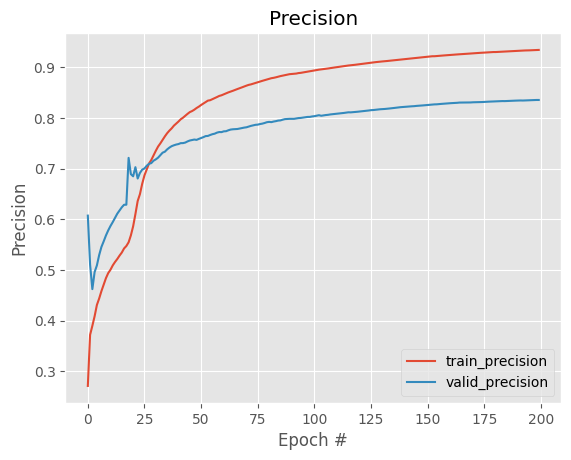

In [49]:
pre_t = open('./Workshop/Session_1/Models/model_ResNet50_train_precision_list.json')
pre_t = json.load(pre_t)

pre_v = open('./Workshop/Session_1/Models/model_ResNet50_valid_precision_list.json')
pre_v = json.load(pre_v)

plt.ion()

plt.style.use("ggplot")
plt.figure()
plt.plot(pre_t, label="train_precision")
plt.plot(pre_v, label="valid_precision")

plt.title("Precision")
plt.xlabel("Epoch #")
plt.ylabel("Precision")
plt.legend(loc="lower right")

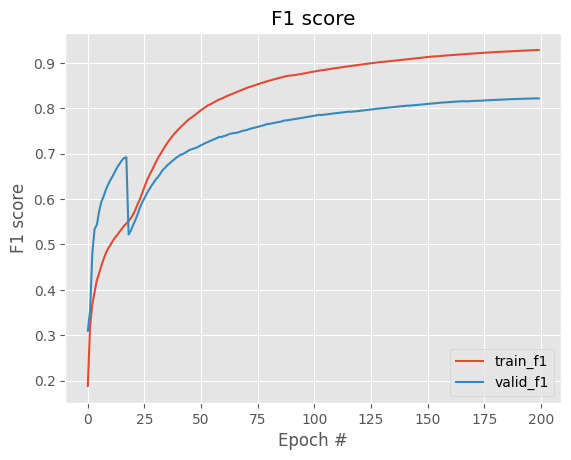

In [50]:
f1_t = open('./Workshop/Session_1/Models/model_ResNet50_train_f1_list.json')
f1_t = json.load(f1_t)

f1_v = open('./Workshop/Session_1/Models/model_ResNet50_valid_f1_list.json')
f1_v = json.load(f1_v)

plt.ion()

plt.style.use("ggplot")
plt.figure()
plt.plot(f1_t, label="train_f1")
plt.plot(f1_v, label="valid_f1")

plt.title("F1 score")
plt.xlabel("Epoch #")
plt.ylabel("F1 score")
plt.legend(loc="lower right")

#<center> <font face=timenewroman color=yellow>Test</center>

## <center> <font face=timenewroman color=gree>Prepare model</center>

In [17]:
model_test = timm.create_model('resnet50', pretrained=True)

model_test.fc = torch.nn.Sequential(torch.nn.Linear(2048, 256),
                                    torch.nn.Dropout(0.2),
                                    torch.nn.ReLU(),
                                    torch.nn.Linear(256, 64),
                                    torch.nn.Dropout(0.2),
                                    torch.nn.ReLU(),
                                    torch.nn.Linear(64, 32),
                                    torch.nn.Dropout(0.2),
                                    torch.nn.ReLU(),                               
                                    torch.nn.Linear(32, 4),                                                                     
                                    torch.nn.Softmax()
                                    )

In [18]:
model_test.load_state_dict(torch.load(model_path + 'model_ResNet50_acc_max.pt'))

<All keys matched successfully>

In [19]:
model_test = model_test.cuda()

## <center> <font face=timenewroman color=gree>Start Test</center>

In [20]:
class_name = ['adenocarcinoma',
              'large.cell.carcinoma',
              'normal',
              'squamous.cell.carcinoma']

Probability of normal : 100.000000
normal


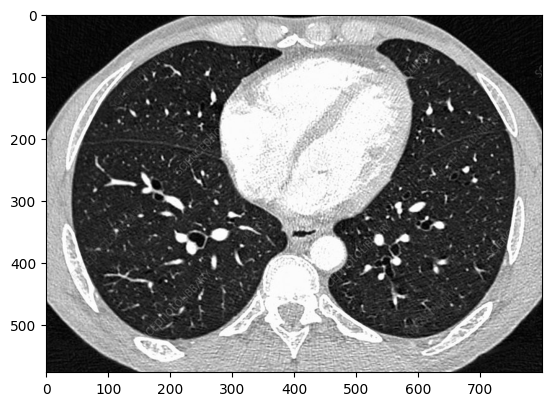

Probability of normal : 100.000000
normal


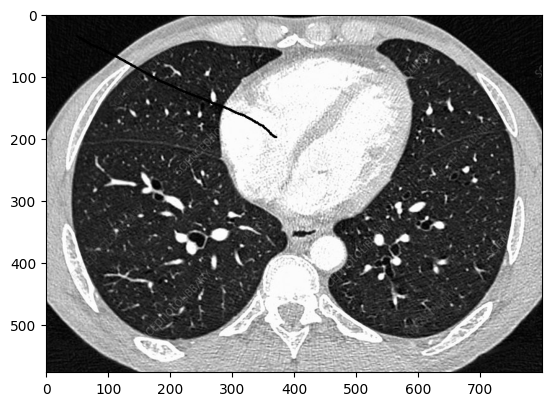

Probability of normal : 100.000000
normal


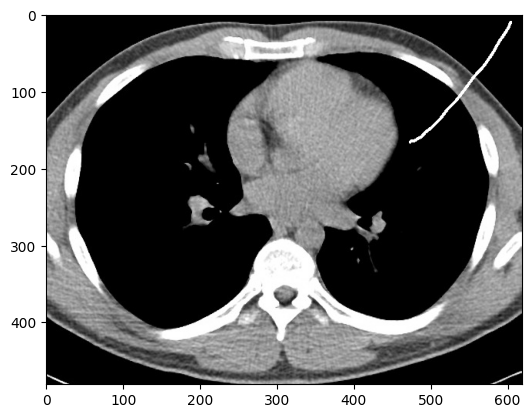

Probability of normal : 100.000000
normal


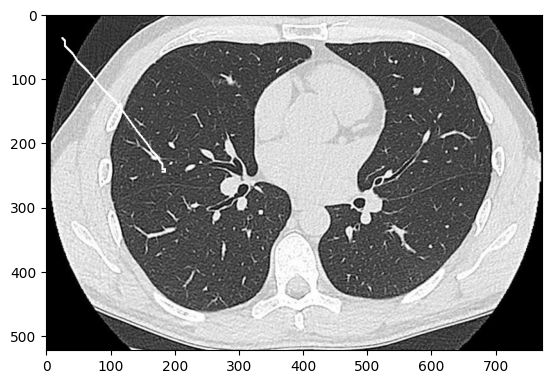

Probability of normal : 100.000000
normal


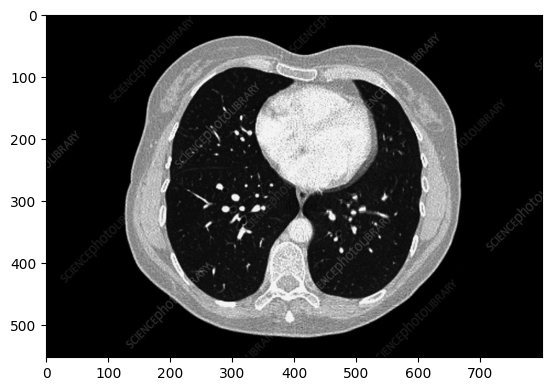

Probability of normal : 100.000000
normal


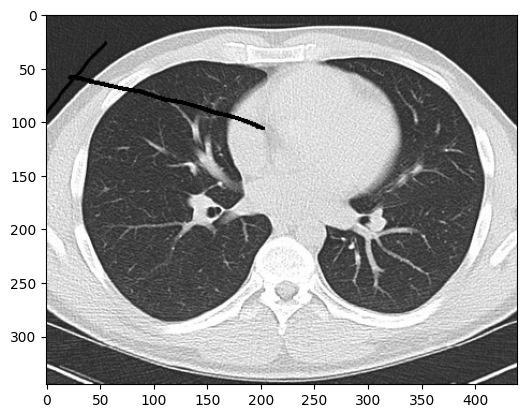

Probability of normal : 100.000000
normal


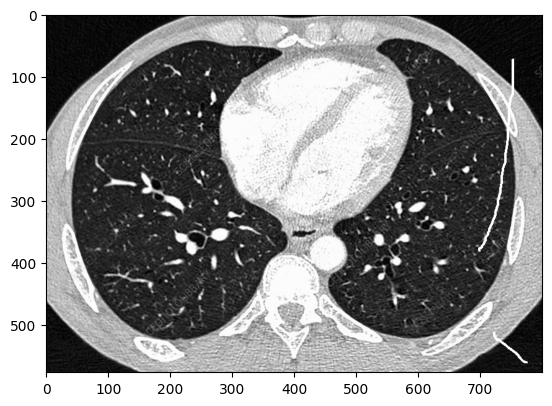

Probability of normal : 100.000000
normal


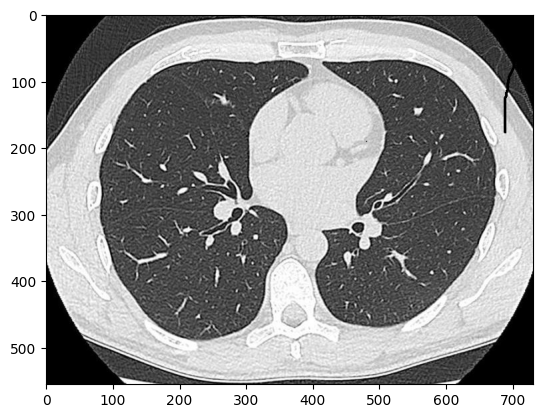

Probability of normal : 100.000000
normal


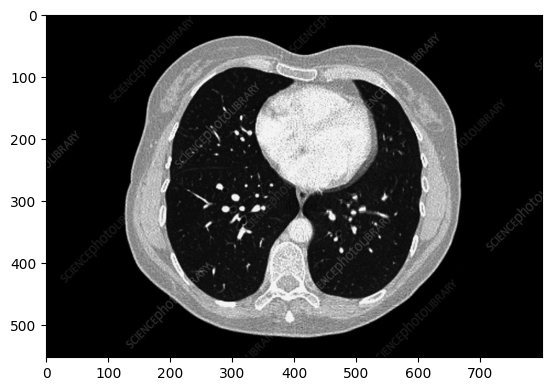

Probability of normal : 100.000000
normal


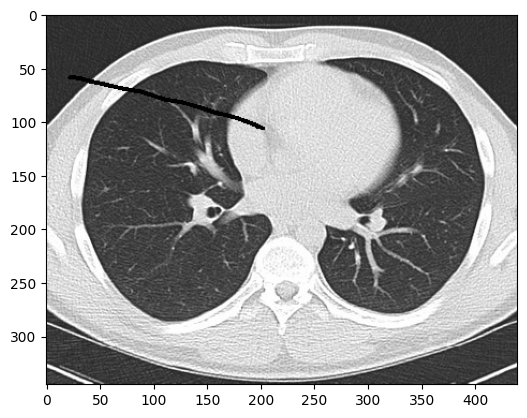

Probability of normal : 100.000000
normal


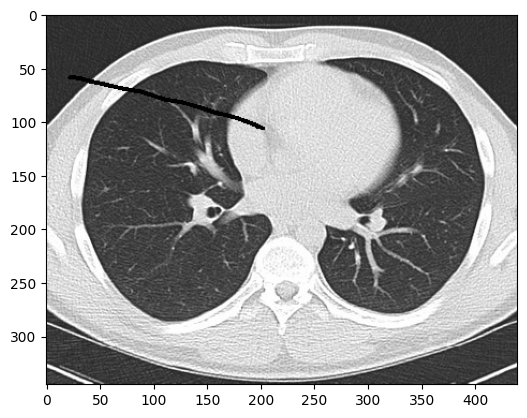

Probability of normal : 100.000000
normal


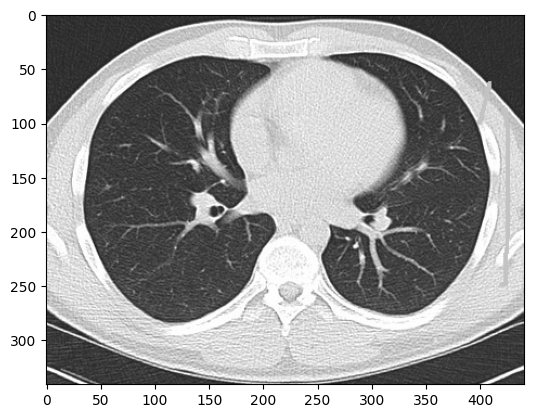

Probability of normal : 100.000000
normal


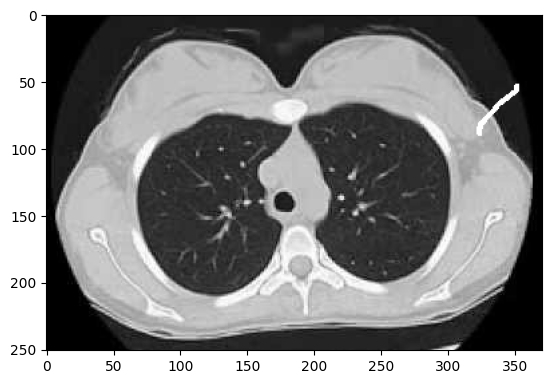

Probability of normal : 100.000000
normal


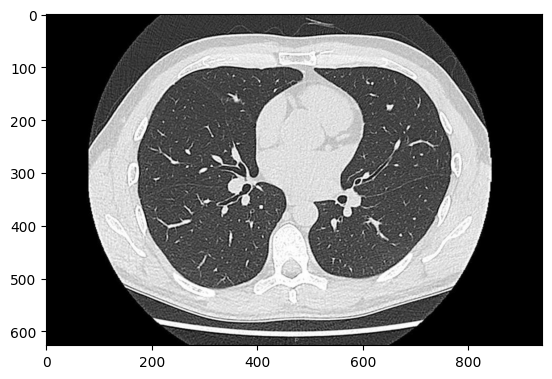

Probability of normal : 100.000000
normal


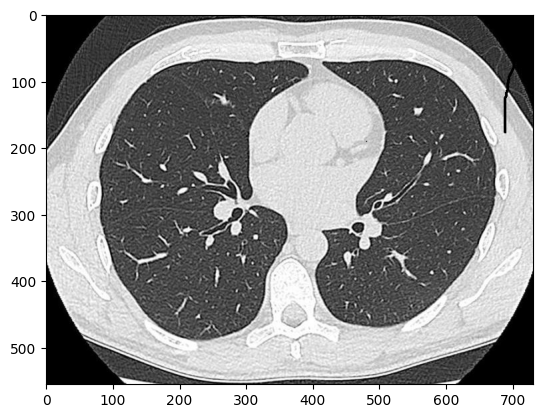

Probability of normal : 100.000000
normal


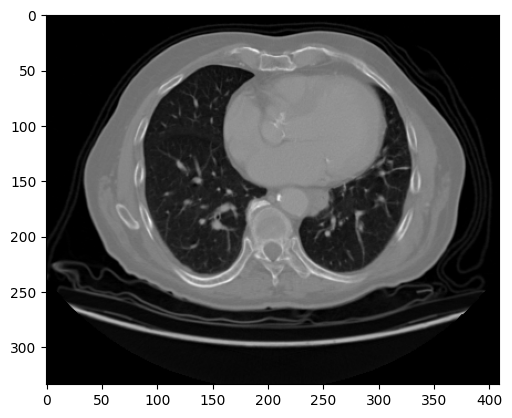

Probability of squamous.cell.carcinoma : 73.588693
squamous.cell.carcinoma


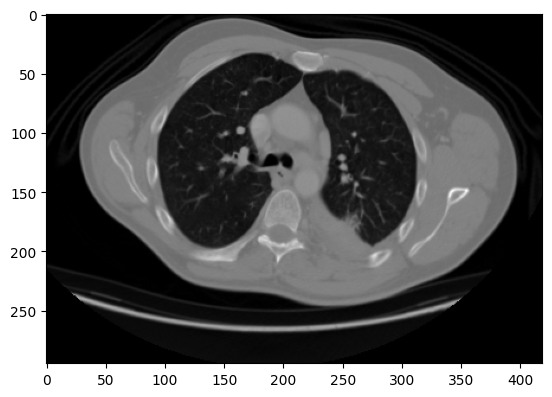

Probability of adenocarcinoma : 99.999702
squamous.cell.carcinoma


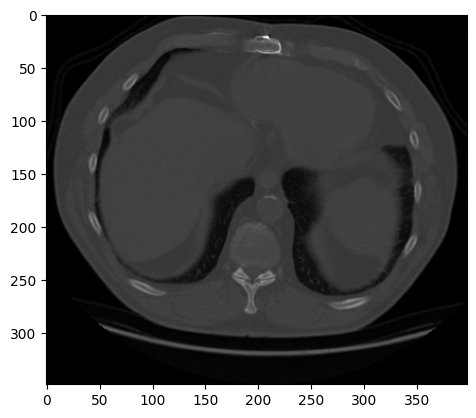

Probability of adenocarcinoma : 99.002773
squamous.cell.carcinoma


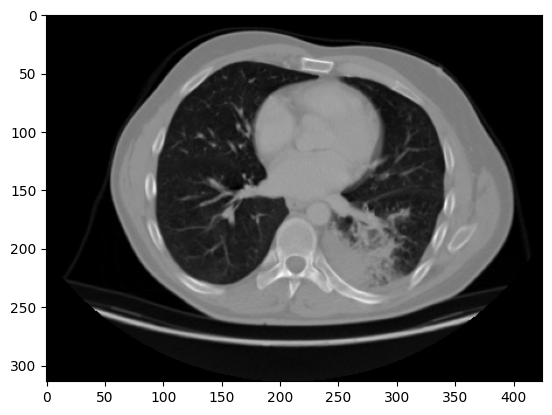

Probability of squamous.cell.carcinoma : 100.000000
squamous.cell.carcinoma


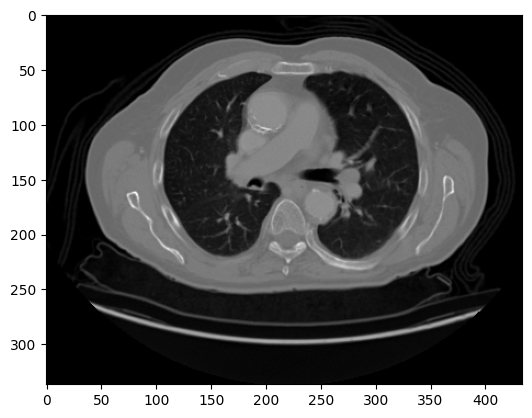

Probability of adenocarcinoma : 64.970833
squamous.cell.carcinoma


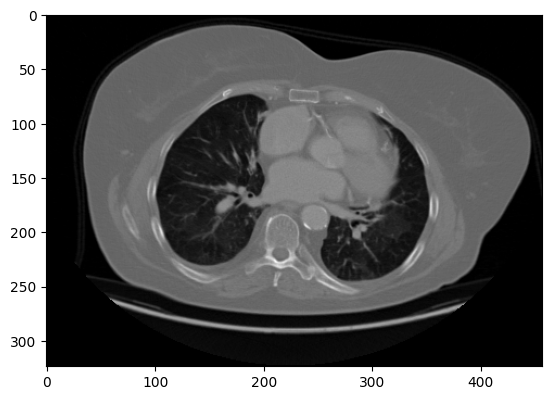

Probability of adenocarcinoma : 98.240083
squamous.cell.carcinoma


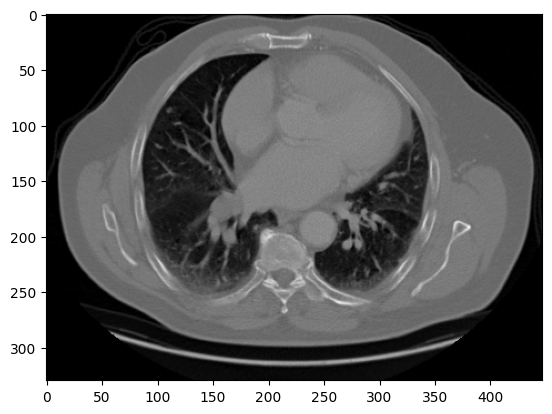

Probability of squamous.cell.carcinoma : 100.000000
squamous.cell.carcinoma


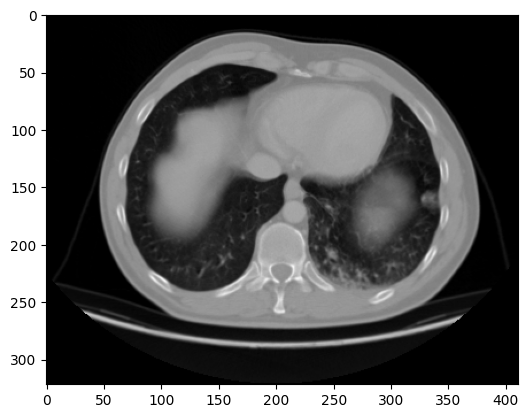

Probability of large.cell.carcinoma : 99.801707
squamous.cell.carcinoma


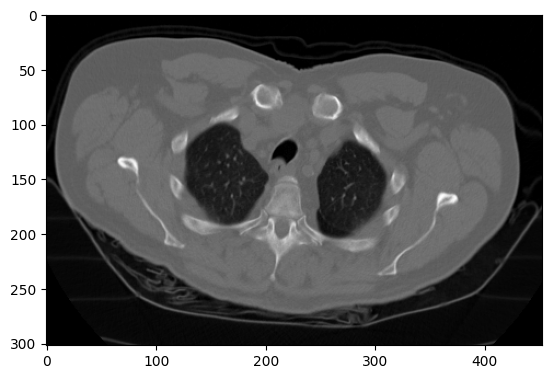

Probability of squamous.cell.carcinoma : 99.999881
squamous.cell.carcinoma


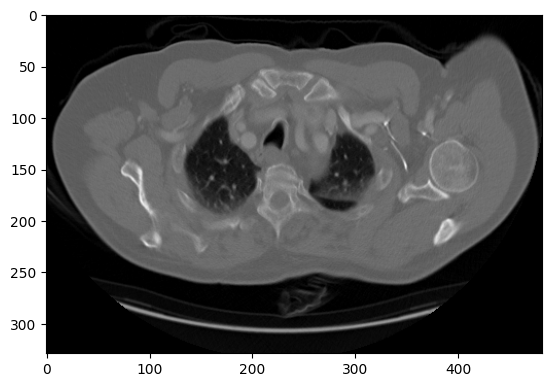

Probability of adenocarcinoma : 100.000000
squamous.cell.carcinoma


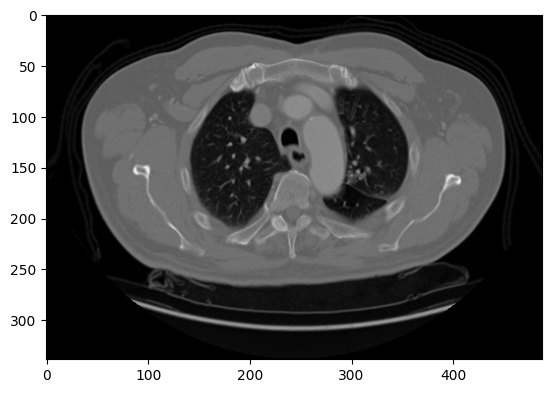

Probability of adenocarcinoma : 59.041518
squamous.cell.carcinoma


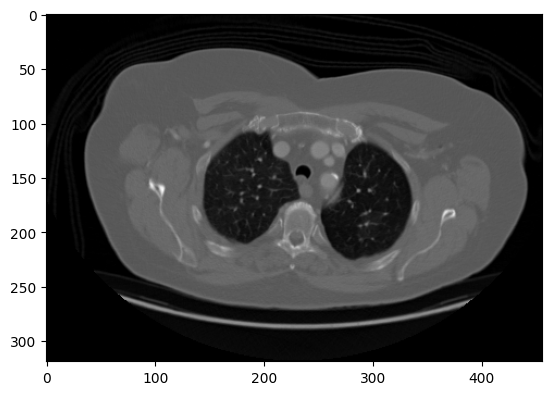

Probability of adenocarcinoma : 99.777138
squamous.cell.carcinoma


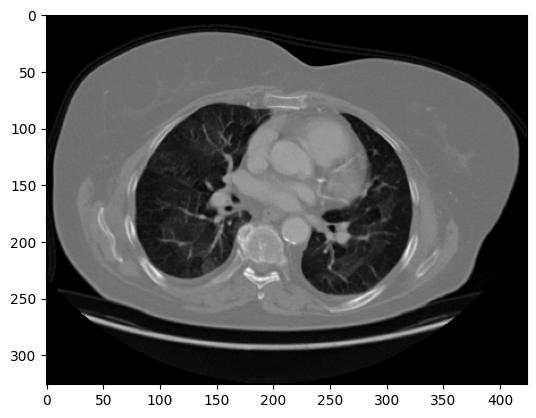

Probability of squamous.cell.carcinoma : 63.745707
squamous.cell.carcinoma


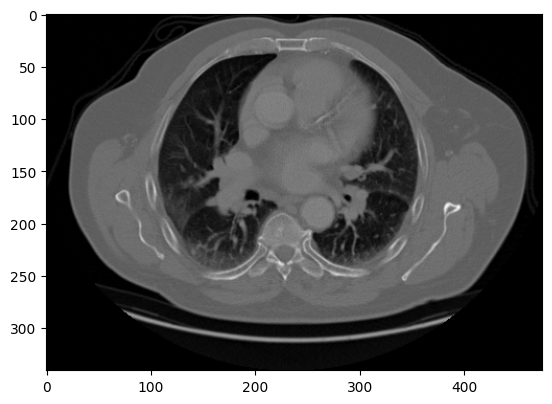

Probability of squamous.cell.carcinoma : 100.000000
squamous.cell.carcinoma


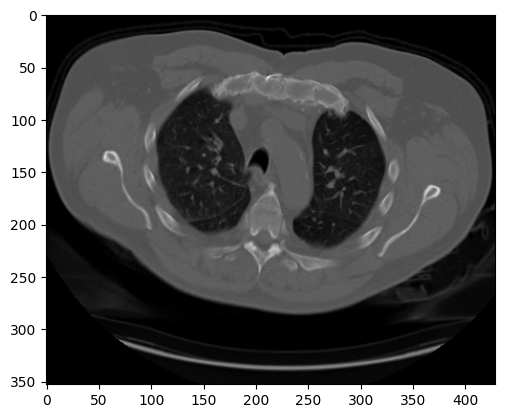

Probability of squamous.cell.carcinoma : 100.000000
squamous.cell.carcinoma


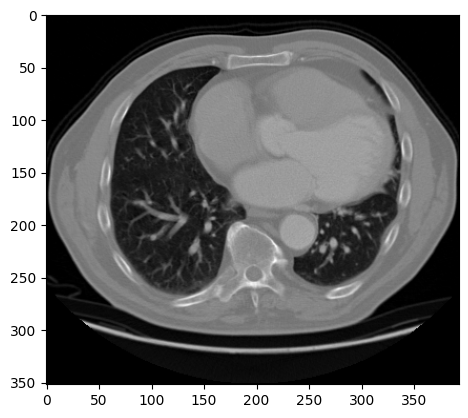

Probability of squamous.cell.carcinoma : 99.999177
squamous.cell.carcinoma


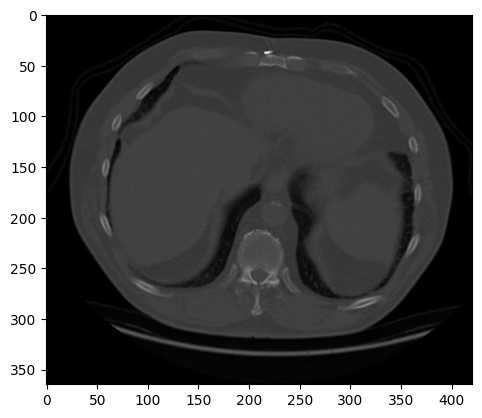

Probability of squamous.cell.carcinoma : 99.800223
squamous.cell.carcinoma


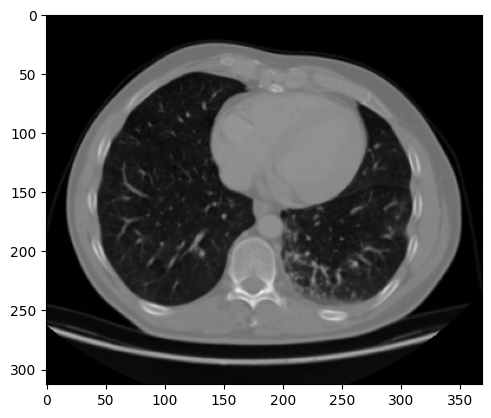

Probability of squamous.cell.carcinoma : 99.290025
squamous.cell.carcinoma


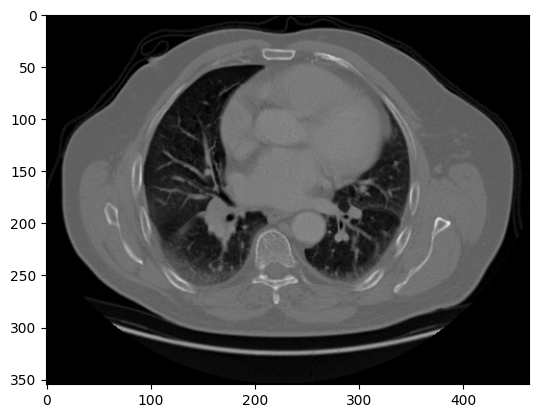

Probability of squamous.cell.carcinoma : 100.000000
squamous.cell.carcinoma


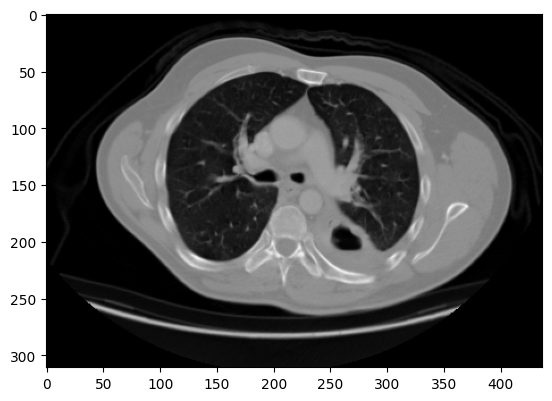

Probability of squamous.cell.carcinoma : 98.599631
squamous.cell.carcinoma


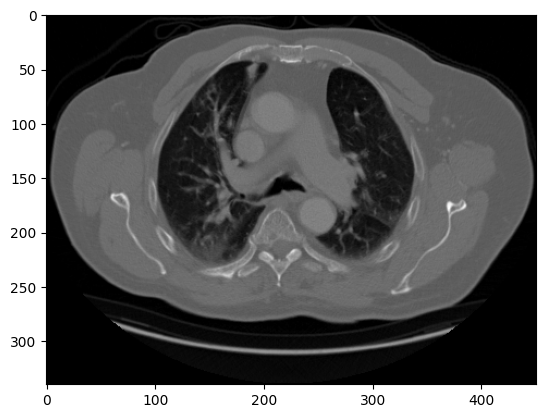

Probability of adenocarcinoma : 100.000000
squamous.cell.carcinoma


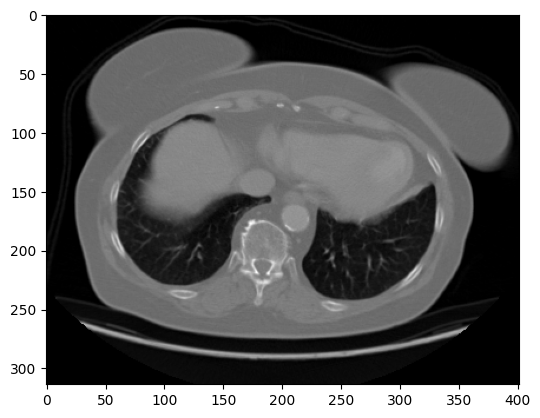

Probability of adenocarcinoma : 99.999702
squamous.cell.carcinoma


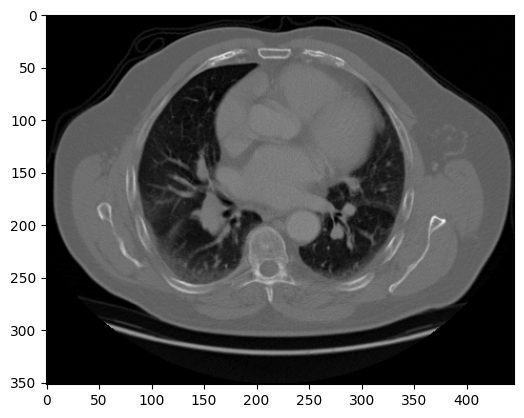

Probability of squamous.cell.carcinoma : 100.000000
squamous.cell.carcinoma


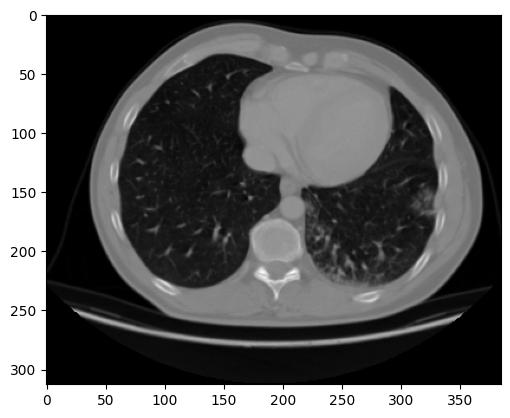

Probability of adenocarcinoma : 98.225385
squamous.cell.carcinoma


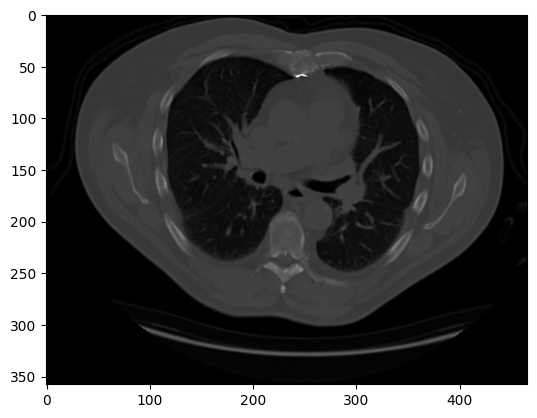

Probability of adenocarcinoma : 99.999976
squamous.cell.carcinoma


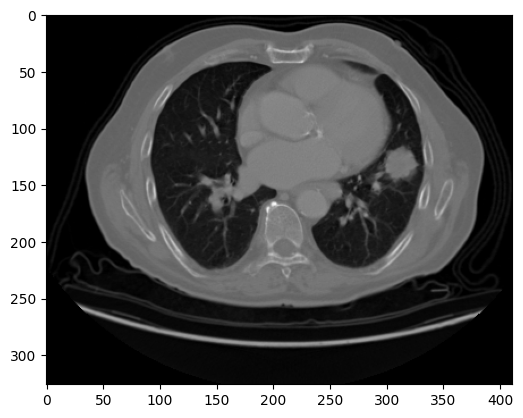

Probability of adenocarcinoma : 99.993551
squamous.cell.carcinoma


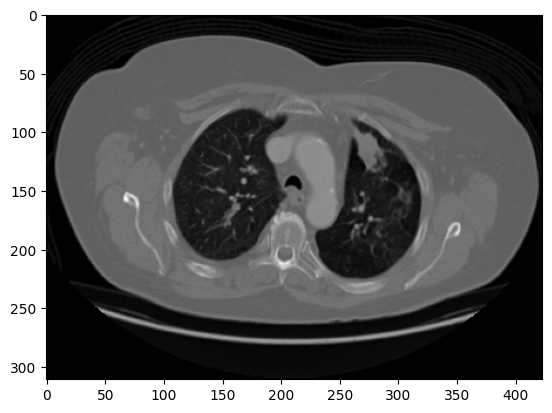

Probability of adenocarcinoma : 97.379988
squamous.cell.carcinoma


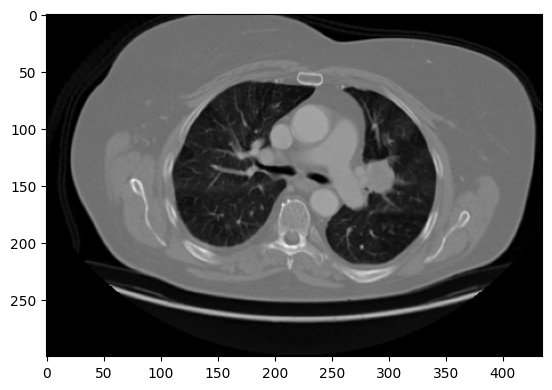

Probability of adenocarcinoma : 100.000000
squamous.cell.carcinoma


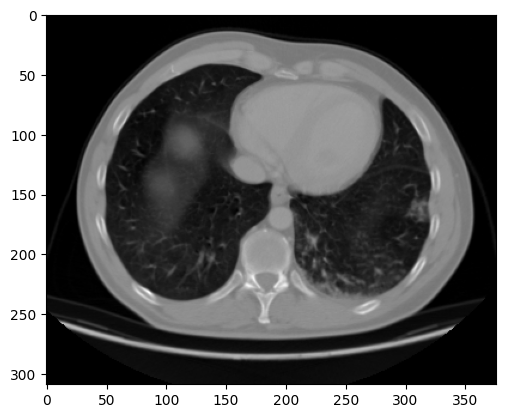

Probability of adenocarcinoma : 97.772652
squamous.cell.carcinoma


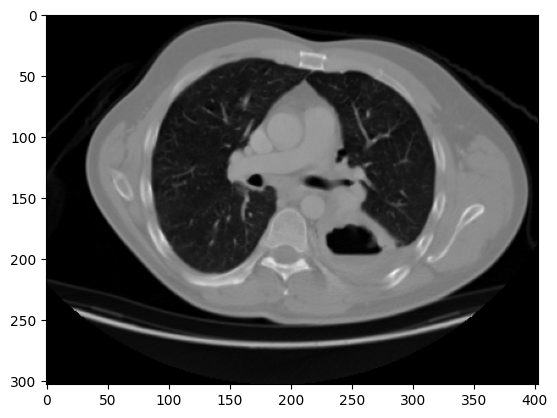

Probability of squamous.cell.carcinoma : 96.292007
squamous.cell.carcinoma


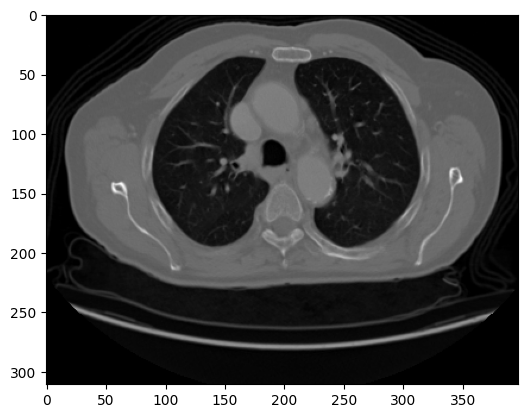

Probability of large.cell.carcinoma : 99.990213
squamous.cell.carcinoma


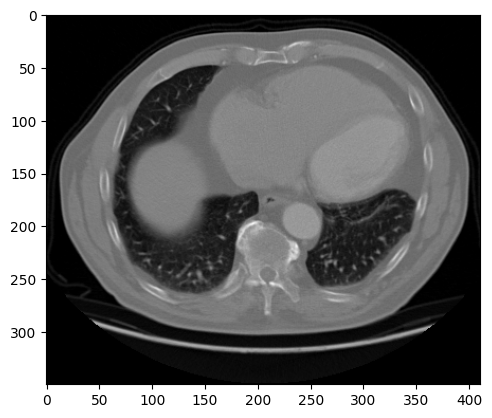

Probability of adenocarcinoma : 98.466361
squamous.cell.carcinoma


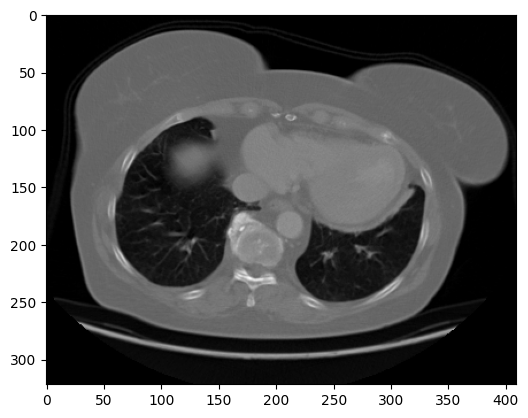

Probability of adenocarcinoma : 99.998939
squamous.cell.carcinoma


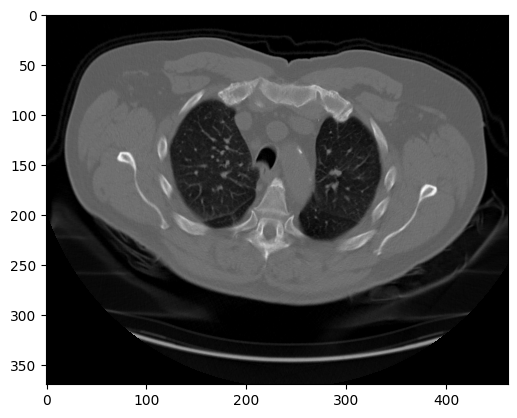

Probability of squamous.cell.carcinoma : 100.000000
squamous.cell.carcinoma


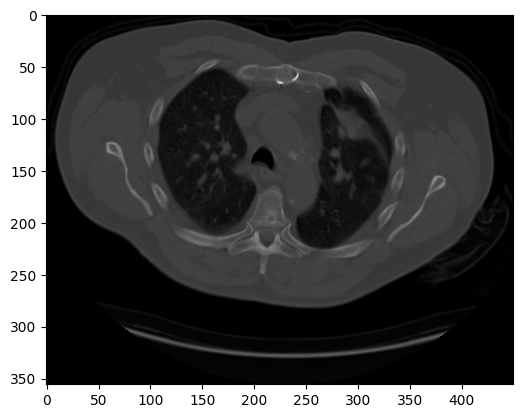

Probability of squamous.cell.carcinoma : 99.786526
squamous.cell.carcinoma


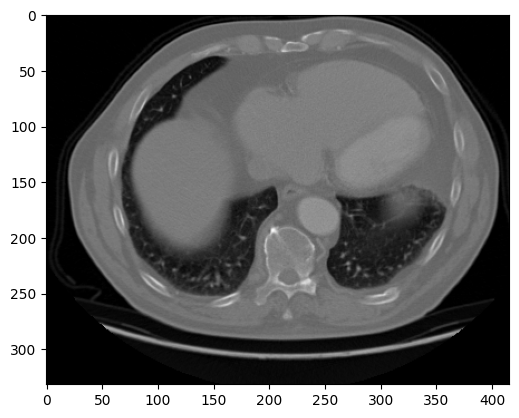

Probability of squamous.cell.carcinoma : 100.000000
squamous.cell.carcinoma


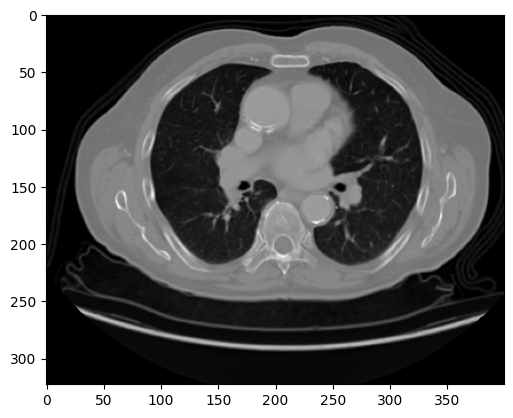

Probability of squamous.cell.carcinoma : 95.437014
squamous.cell.carcinoma


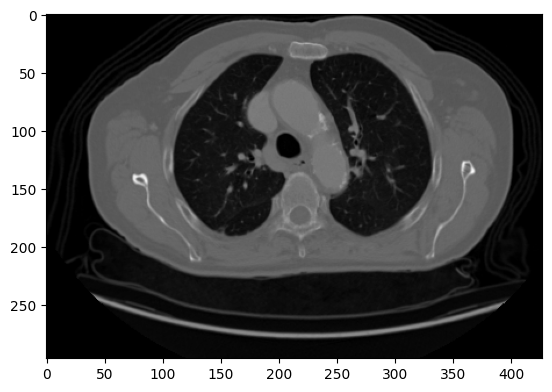

Probability of large.cell.carcinoma : 99.770653
squamous.cell.carcinoma


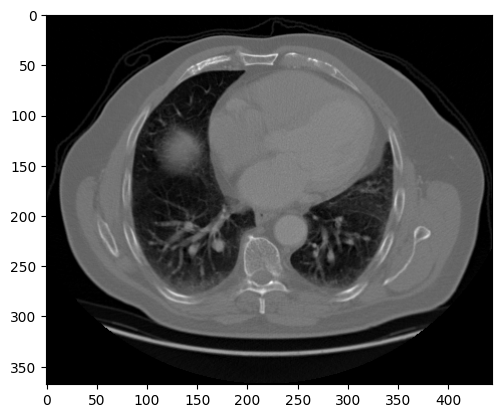

Probability of squamous.cell.carcinoma : 100.000000
squamous.cell.carcinoma


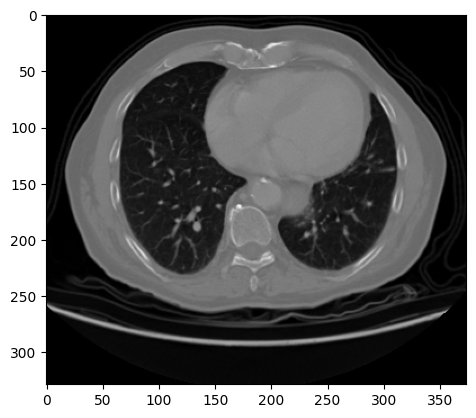

Probability of adenocarcinoma : 99.754375
squamous.cell.carcinoma


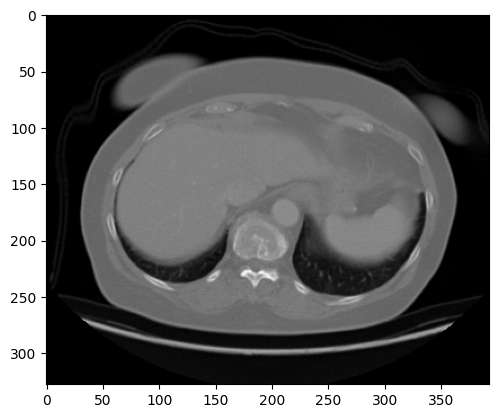

Probability of adenocarcinoma : 96.791703
squamous.cell.carcinoma


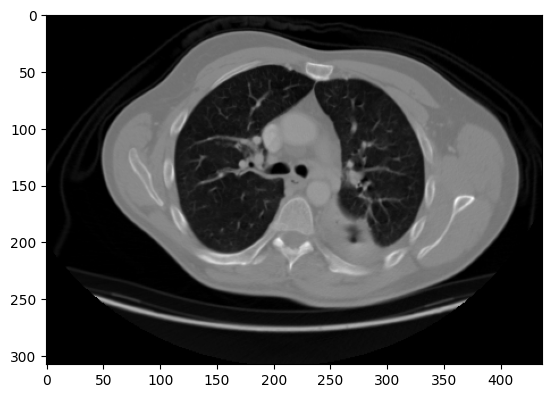

Probability of adenocarcinoma : 89.850324
squamous.cell.carcinoma


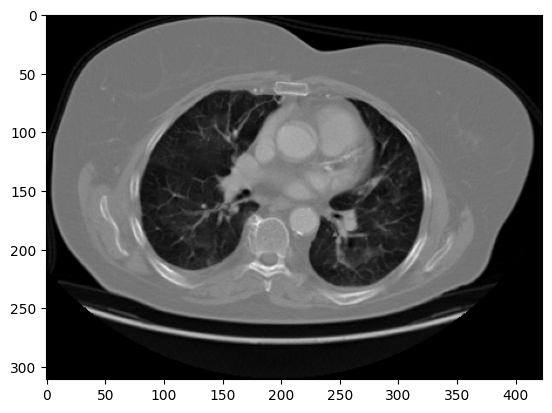

Probability of squamous.cell.carcinoma : 99.961782
squamous.cell.carcinoma


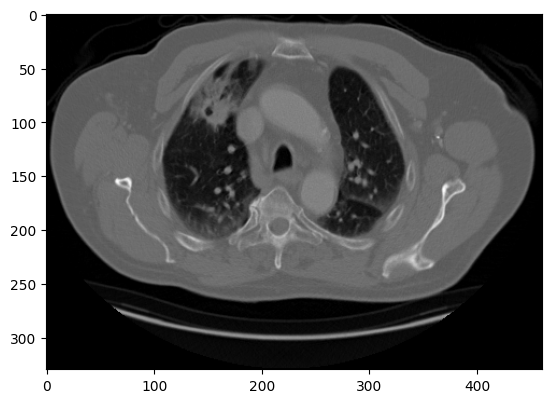

Probability of adenocarcinoma : 100.000000
squamous.cell.carcinoma


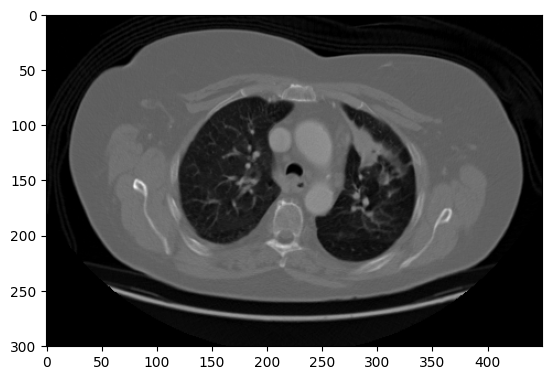

Probability of adenocarcinoma : 99.999917
squamous.cell.carcinoma


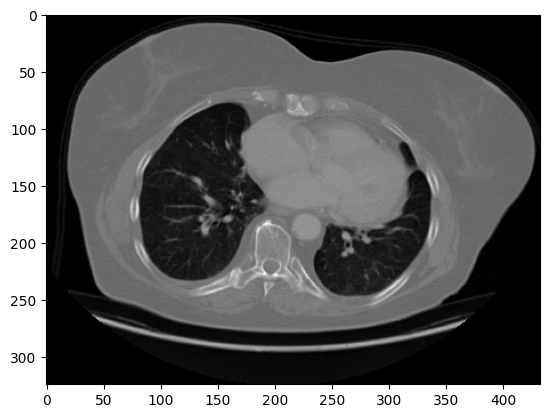

Probability of large.cell.carcinoma : 96.332246
squamous.cell.carcinoma


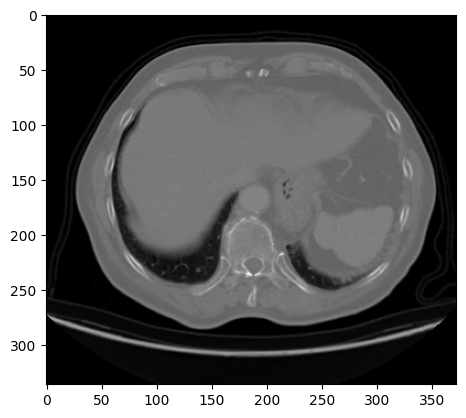

Probability of squamous.cell.carcinoma : 100.000000
squamous.cell.carcinoma


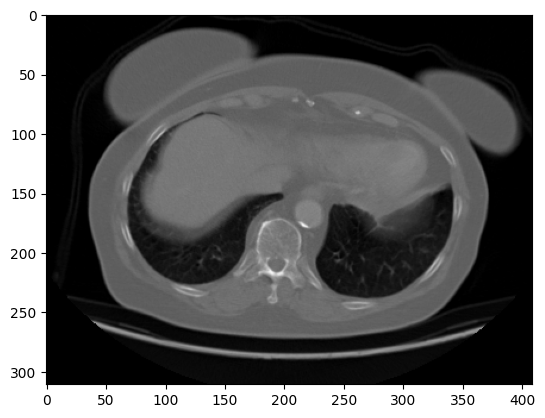

Probability of large.cell.carcinoma : 99.992156
squamous.cell.carcinoma


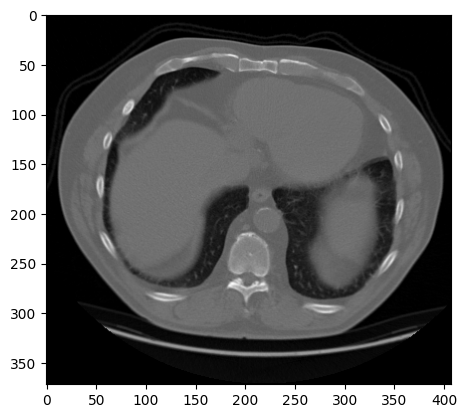

Probability of squamous.cell.carcinoma : 99.996054
squamous.cell.carcinoma


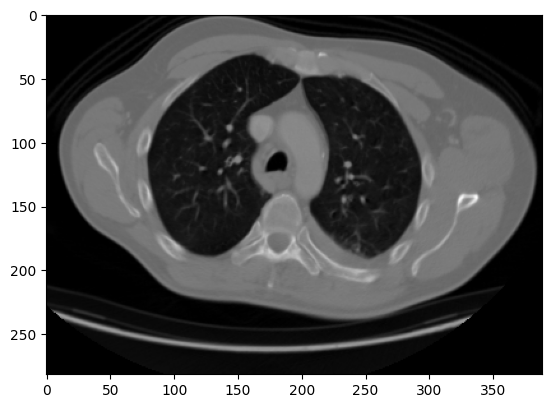

Probability of adenocarcinoma : 99.772125
squamous.cell.carcinoma


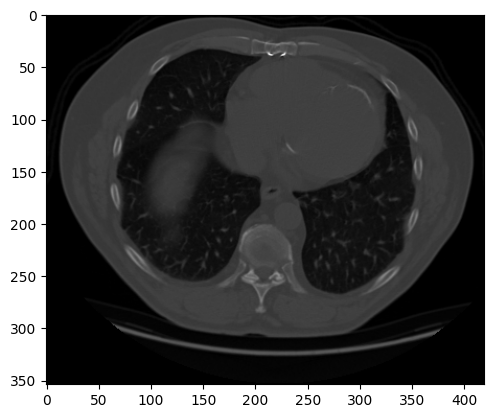

Probability of adenocarcinoma : 99.997127
squamous.cell.carcinoma


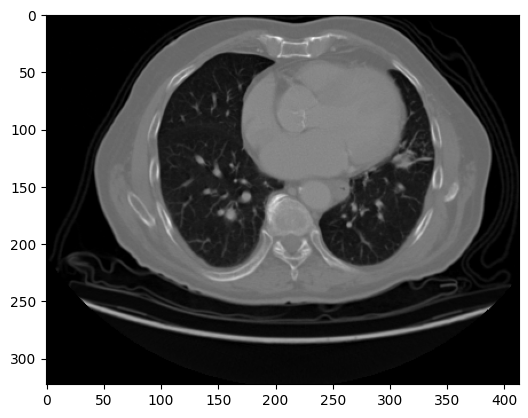

Probability of squamous.cell.carcinoma : 99.808937
squamous.cell.carcinoma


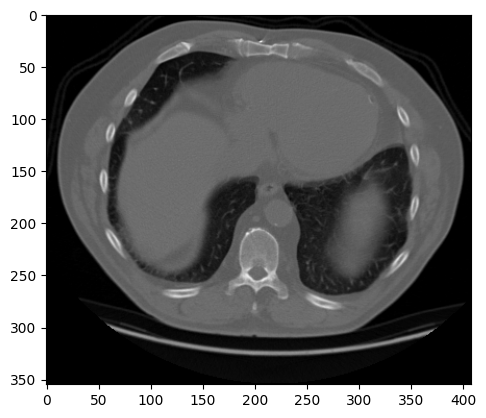

Probability of adenocarcinoma : 99.879932
squamous.cell.carcinoma


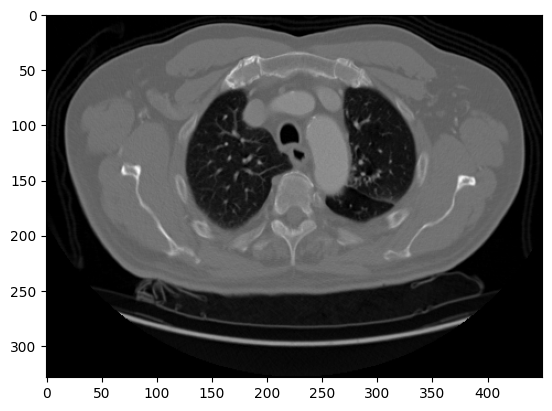

Probability of adenocarcinoma : 97.232193
squamous.cell.carcinoma


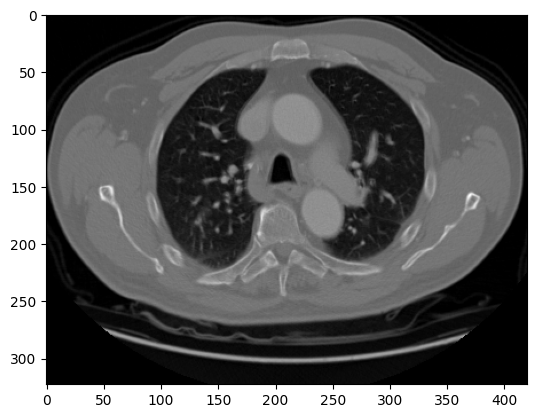

Probability of adenocarcinoma : 99.999321
squamous.cell.carcinoma


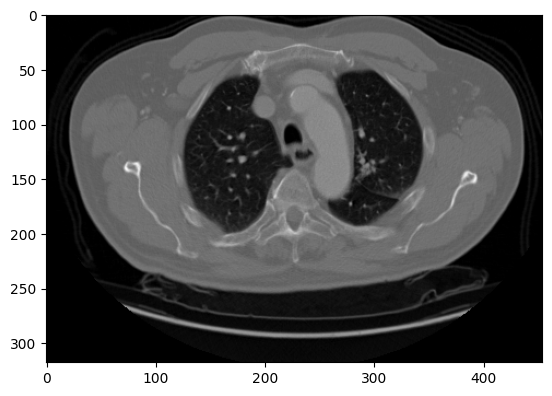

Probability of adenocarcinoma : 99.643373
squamous.cell.carcinoma


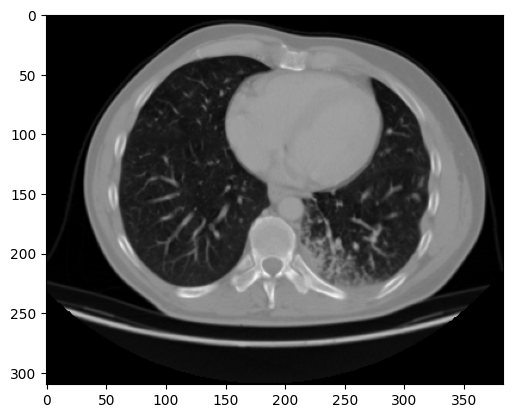

Probability of squamous.cell.carcinoma : 99.892789
squamous.cell.carcinoma


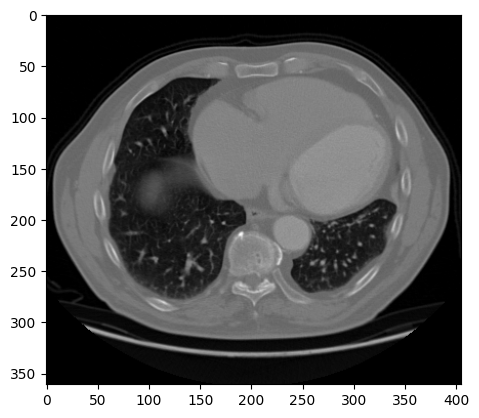

Probability of adenocarcinoma : 99.997604
squamous.cell.carcinoma


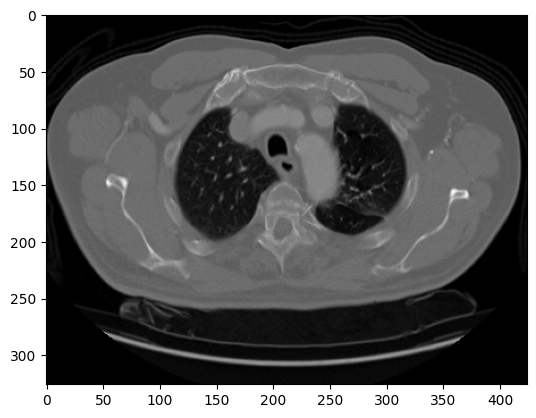

Probability of squamous.cell.carcinoma : 99.230981
squamous.cell.carcinoma


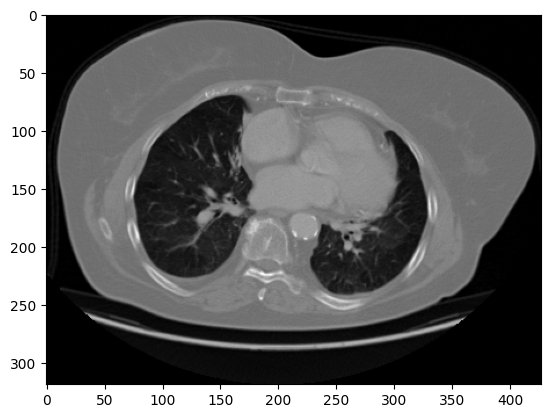

Probability of adenocarcinoma : 47.300908
squamous.cell.carcinoma


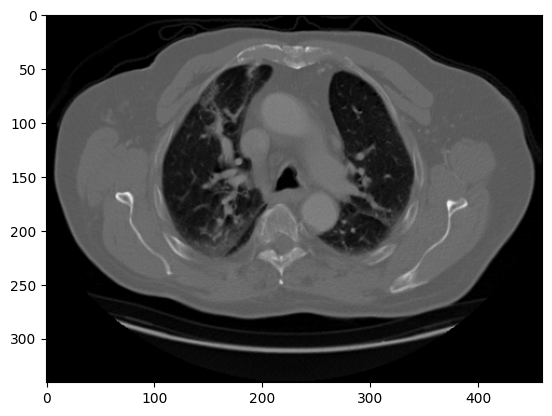

Probability of adenocarcinoma : 100.000000
squamous.cell.carcinoma


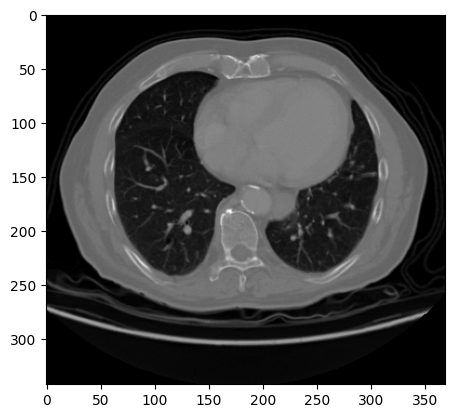

Probability of adenocarcinoma : 91.993052
squamous.cell.carcinoma
Accuracy of Model = 0.7297297297297297


In [23]:
true_count = 0
all_data   = 0
for class_file in class_name:
  image_path = glob.glob(Dataset + '/test/' + class_file + '/*')  
  all_data  += len(glob.glob(Dataset + '/test/' + class_file + '/*'))
  for image in image_path:    
    _ ,prediction= app(image, model_test, 'cuda', class_name, True, True)
    print(class_file)
    if class_file == prediction:
      true_count += 1

print('Accuracy of Model = {}'.format(true_count/all_data))